In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd

/Users/yufeitang/opt/anaconda3/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# from string import ascii_letters
import seaborn as sns

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.cluster import KMeans
import scikitplot.plotters as skplt 
#import plot_elbow_curve,plot_silhouette

In [3]:
df =  pd.read_csv('London_traffic_accidents.csv')

In [4]:
df['accident_index'].drop_duplicates(inplace=True)

In [5]:
df

,index,geometry,index_right,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,0,POINT (-0.279323 51.584754),182,Kenton,E05000093,224.315,0.0,E09000005,Brent,116946,...,Journey as part of work,1.0,51.0,8.0,1461.0,Petrol,8.0,-1,3.0,1.0
1,1063,POINT (-0.314008 51.583639),182,Kenton,E05000093,224.315,0.0,E09000005,Brent,116946,...,Not known,1.0,67.0,10.0,2143.0,Heavy Oil,3.0,-1,7.0,1.0
2,1120,POINT (-0.282202 51.584976),182,Kenton,E05000093,224.315,0.0,E09000005,Brent,116946,...,Not known,1.0,31.0,6.0,1339.0,Hybrid electric,6.0,-1,4.0,1.0
3,1202,POINT (-0.306828 51.586503),182,Kenton,E05000093,224.315,0.0,E09000005,Brent,116946,...,Not known,1.0,20.0,4.0,2499.0,Heavy Oil,8.0,-1,4.0,1.0
4,3411,POINT (-0.307563 51.586154),182,Kenton,E05000093,224.315,0.0,E09000005,Brent,116946,...,Not known,1.0,41.0,7.0,1248.0,Heavy Oil,4.0,-1,4.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106933,243695,POINT (-0.091137 51.518141),627,Cripplegate,E05000015,14.545,0.0,E09000001,City of London,122522,...,Other,1.0,58.0,9.0,1797.0,Hybrid electric,8.0,-1,-1.0,-1.0
106934,243719,POINT (-0.09736300000000001 51.521614),627,Cripplegate,E05000015,14.545,0.0,E09000001,City of London,122522,...,Other,2.0,36.0,7.0,782.0,Petrol,8.0,-1,-1.0,-1.0
106935,243743,POINT (-0.090361 51.519477),627,Cripplegate,E05000015,14.545,0.0,E09000001,City of London,122522,...,Journey as part of work,1.0,59.0,9.0,2148.0,Heavy Oil,8.0,-1,-1.0,-1.0
106936,365105,POINT (-0.09370199999999999 51.517481),627,Cripplegate,E05000015,14.545,0.0,E09000001,City of London,122522,...,Journey as part of work,2.0,25.0,5.0,108.0,Petrol,8.0,-1,2.0,1.0


In [6]:
len(df)

106938

In [7]:
df1 = df[['accident_index','longitude','latitude','accident_severity']]

In [8]:
df1['accident_index'].drop_duplicates(inplace=True)

/Users/yufeitang/opt/anaconda3/lib/python3.9/site-packages/pandas/core/series.py:2136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(result)


In [9]:
df1

,accident_index,longitude,latitude,accident_severity
0,2016010000005,-0.279323,51.584754,Slight
1,2016010001734,-0.314008,51.583639,Slight
2,2016010001856,-0.282202,51.584976,Slight
3,2016010001998,-0.306828,51.586503,Slight
4,2016010006770,-0.307563,51.586154,Slight
...,...,...,...,...
106933,2017480200025,-0.091137,51.518141,Slight
106934,2017480212273,-0.097363,51.521614,Slight
106935,2017480226577,-0.090361,51.519477,Slight
106936,2018480289883,-0.093702,51.517481,Slight


In [10]:
import scikitplot.plotters as skplt 
#import plot_elbow_curve,plot_silhouette

In [11]:
import scikitplot.plotters as skplt 
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

In [12]:
X = df1[['longitude','latitude']]

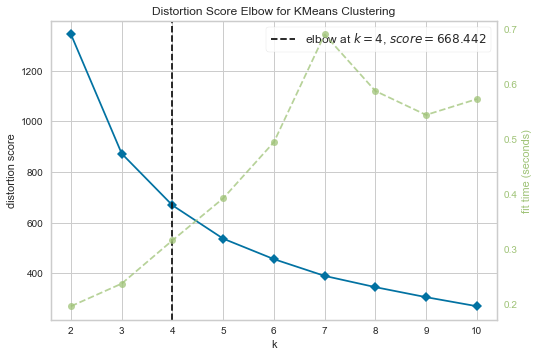

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [13]:
model = KMeans(random_state=42)

elb_visualizer = KElbowVisualizer(model, k=(2,11))
elb_visualizer.fit(X)    
elb_visualizer.show()  

In [14]:
kmean_input = df1[['longitude','latitude']].sample(10000)

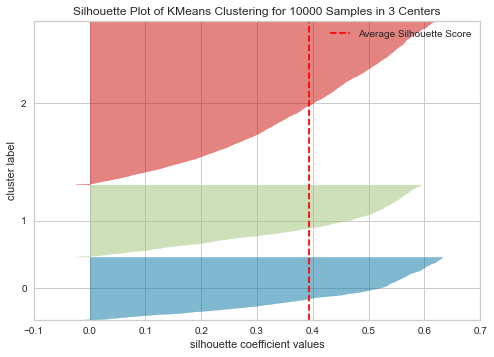

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10000 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [15]:
# Instantiate the clustering model and visualizer
model = KMeans(3, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(kmean_input)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

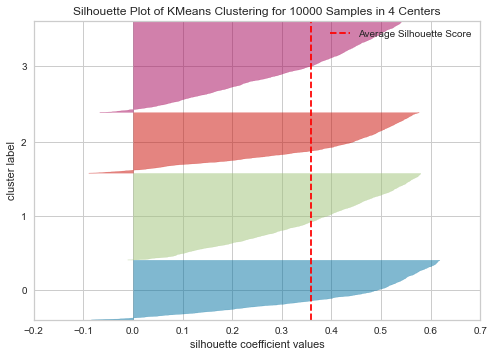

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10000 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [16]:
# Instantiate the clustering model and visualizer
model = KMeans(4, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(kmean_input)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

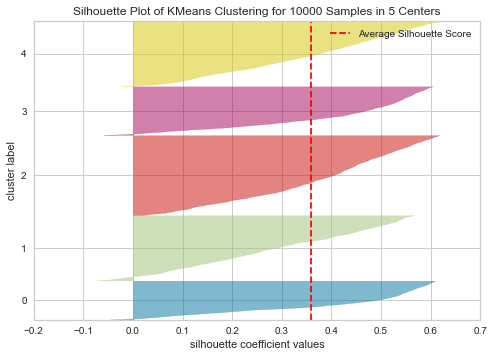

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 10000 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [17]:
# Instantiate the clustering model and visualizer
model = KMeans(5, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(kmean_input)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [18]:
kmeans = KMeans(n_clusters=5, random_state=0)
kmeans.fit(df1[['longitude','latitude']])
df1['cluster'] = kmeans.labels_

/var/folders/cb/rw9tz7zj639fh06t6jshwfqc0000gn/T/ipykernel_4076/62533263.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['cluster'] = kmeans.labels_


In [19]:
df1['cluster'] = df1['cluster'].astype(str)


/var/folders/cb/rw9tz7zj639fh06t6jshwfqc0000gn/T/ipykernel_4076/2726454304.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['cluster'] = df1['cluster'].astype(str)


In [20]:
%matplotlib inline
df = df1
access_token = 'pk.eyJ1IjoibWFwYm94IiwiYSI6ImNpejY4M29iazA2Z2gycXA4N2pmbDZmangifQ.-g_vE53SD2WrJ6tFX7QHmA'
px.set_mapbox_access_token(access_token)
start_plt = px.scatter_mapbox(df, 
                         lat='latitude', 
                         lon='longitude',
                         color= "cluster",
                         size_max=8, 
                         zoom=1,
                         hover_name= df.cluster,
                         title = 'Traffic Accidents per Cluster',
                         mapbox_style = 'streets',
                         width=800,
                         height=800)

start_plt.show()

In [21]:
import folium

In [22]:
from pyproj import crs
import geopandas as gpd
import matplotlib.pyplot as plt

In [23]:
# Create a Map instance
m = folium.Map(location=[60.25, 24.8], zoom_start=10, control_scale=True)

In [24]:
# Create a Map instance
m = folium.Map(location=[51.504873, 0.049368], zoom_start=10, control_scale=True)

In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106938 entries, 0 to 106937
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   accident_index     106938 non-null  object 
 1   longitude          106938 non-null  float64
 2   latitude           106938 non-null  float64
 3   accident_severity  106938 non-null  object 
 4   cluster            106938 non-null  object 
dtypes: float64(2), object(3)
memory usage: 4.1+ MB


In [26]:
df1['cluster'] = df1['cluster'].astype(int)

/var/folders/cb/rw9tz7zj639fh06t6jshwfqc0000gn/T/ipykernel_4076/808869838.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
df1 = df1.sample(10000)

In [28]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 56959 to 69553
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   accident_index     10000 non-null  object 
 1   longitude          10000 non-null  float64
 2   latitude           10000 non-null  float64
 3   accident_severity  10000 non-null  object 
 4   cluster            10000 non-null  int64  
dtypes: float64(2), int64(1), object(2)
memory usage: 468.8+ KB


In [29]:
import matplotlib.cm as cm
import matplotlib.colors as colors

In [30]:
map_clusters = folium.Map(location=[51.504873, 0.049368], zoom_start=4, control_scale=True)
# set color scheme for the clusters
x = np.arange(5)
ys = [i + x + (i*x)**2 for i in range(5)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]
colors = ['red','blue','purple','orange','green']
# add markers to the map
markers_colors = []
markers_colors = []
for lat, lng, cluster in zip(df1['latitude'], df1['longitude'],  df1['cluster']):
        folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=1,
        #popup=label,
        tooltip =  '- Cluster ' + str(cluster),
        color=colors[cluster-1],
        fill=True,
        fill_color=colors[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)

map_clusters



In [31]:
london = {'latitude': 51.504873, 'longitude': 0.049368}

In [32]:
df1.cluster.unique()

array([2, 1, 4, 3, 0])

In [33]:
df1.head()

,accident_index,longitude,latitude,accident_severity,cluster
56959,2018010130481,-0.200060,51.449810,Slight,2
96098,2017010010329,0.141237,51.493983,Slight,1
89874,201601SX20318,-0.209659,51.579665,Slight,2
104821,201601TX20468,-0.384931,51.476278,Slight,4
1600,2017010057822,-0.227744,51.589527,Slight,2


In [34]:
cluster_resuslt = df1.groupby(['cluster','accident_severity'])['accident_index'].count()

In [35]:
cluster_resuslt

cluster  accident_severity
0        Fatal                  11
         Serious               345
         Slight               2163
1        Fatal                   8
         Serious               181
         Slight               1312
2        Fatal                  10
         Serious               344
         Slight               2196
3        Fatal                   9
         Serious               263
         Slight               1724
4        Fatal                  11
         Serious               189
         Slight               1234
Name: accident_index, dtype: int64

https://towardsdatascience.com/silhouette-method-better-than-elbow-method-to-find-optimal-clusters-378d62ff6891

In [36]:
row = df.copy()

In [37]:
row.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106938 entries, 0 to 106937
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   accident_index     106938 non-null  object 
 1   longitude          106938 non-null  float64
 2   latitude           106938 non-null  float64
 3   accident_severity  106938 non-null  object 
 4   cluster            106938 non-null  int64  
dtypes: float64(2), int64(1), object(2)
memory usage: 4.1+ MB


In [38]:
kmeans = KMeans(n_clusters=50, random_state=0)
kmeans.fit(df1[['longitude','latitude']])
df1['cluster'] = kmeans.labels_

In [39]:
df1[0:10]

,accident_index,longitude,latitude,accident_severity,cluster
56959,2018010130481,-0.200060,51.449810,Slight,5
96098,2017010010329,0.141237,51.493983,Slight,2
89874,201601SX20318,-0.209659,51.579665,Slight,7
104821,201601TX20468,-0.384931,51.476278,Slight,47
1600,2017010057822,-0.227744,51.589527,Slight,7
56875,201601WW50476,-0.203409,51.448907,Slight,5
68642,201601FH10075,-0.206279,51.489508,Slight,5
73743,2017010043944,-0.187626,51.385770,Slight,9
67470,2019010210874,0.022348,51.488981,Slight,33
41143,201601HT20138,-0.024896,51.493427,Slight,40


In [40]:
df1.drop_duplicates(subset=['accident_index'],inplace=True)

In [41]:
df.drop_duplicates(subset=['accident_index'],inplace=True)

/Users/yufeitang/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [42]:
df

,accident_index,longitude,latitude,accident_severity,cluster
0,2016010000005,-0.279323,51.584754,Slight,2
1,2016010001734,-0.314008,51.583639,Slight,4
2,2016010001856,-0.282202,51.584976,Slight,4
3,2016010001998,-0.306828,51.586503,Slight,4
4,2016010006770,-0.307563,51.586154,Slight,4
...,...,...,...,...,...
106933,2017480200025,-0.091137,51.518141,Slight,0
106934,2017480212273,-0.097363,51.521614,Slight,0
106935,2017480226577,-0.090361,51.519477,Slight,0
106936,2018480289883,-0.093702,51.517481,Slight,0


In [43]:
df1.drop(columns=['longitude','latitude'],inplace=True)

In [44]:
df1

,accident_index,accident_severity,cluster
56959,2018010130481,Slight,5
96098,2017010010329,Slight,2
89874,201601SX20318,Slight,7
104821,201601TX20468,Slight,47
1600,2017010057822,Slight,7
...,...,...,...
7013,2016010024186,Slight,29
25544,2017010034498,Slight,14
55764,2019010178323,Slight,12
73317,2017010063861,Slight,1


In [45]:
df_old =  pd.read_csv('London_traffic_accidents.csv')

In [46]:
df2 = df_old.merge(df1,on='accident_index',how='inner')

In [47]:
pd.set_option('display.max_columns', 500)

In [48]:
df2

,index,geometry,index_right,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity_x,number_of_vehicles,number_of_casualties,date,day_of_week,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,converted_time,accident_year_x,accident_reference_x,vehicle_reference_x,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,accident_year_y,accident_reference_y,vehicle_reference_y,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,accident_severity_y,cluster
0,1063,POINT (-0.314008 51.583639),182,Kenton,E05000093,224.315,0.000,E09000005,Brent,116946,2016010001734,2016,10001734,516910.0,188550.0,-0.314008,51.583639,1,Slight,2,1,2016-11-15,Tuesday,28,E09000005,E09000005,A,4006,Dual carriageway,30MPH,Other junction,Give way or uncontrolled,Unclassified,0,0,0,Daylight,Fine no high winds,Dry,0,0,Urban,1,2,E01000536,13,2016.0,10001734,1.0,1.0,Passenger,2.0,64.0,9.0,Slight,0.0,0.0,1.0,0.0,0.0,9.0,1.0,7.0,2016.0,10001734,1.0,Car,0.0,18.0,3.0,7.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,No,Not known,1.0,67.0,10.0,2143.0,Heavy Oil,3.0,-1,7.0,1.0,Slight,6
1,8234,POINT (-0.316507 51.582416),182,Kenton,E05000093,224.315,0.000,E09000005,Brent,116946,2016010028669,2016,010028669,516740.0,188410.0,-0.316507,51.582416,1,Slight,2,1,2016-10-18,Tuesday,28,E09000005,E09000005,A,4006,Single carriageway,30MPH,Crossroads,Auto traffic signal,Unclassified,0,0,5,Darkness - lights lit,Fine no high winds,Dry,0,0,Urban,1,2,E01002176,21,2016.0,010028669,1.0,1.0,Driver or rider,1.0,30.0,6.0,Slight,0.0,0.0,0.0,0.0,0.0,9.0,1.0,5.0,2016.0,010028669,1.0,Car,0.0,3.0,6.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,No,Not known,1.0,30.0,6.0,1364.0,Heavy Oil,7.0,-1,5.0,1.0,Slight,6
2,18100,POINT (-0.278592 51.585013),182,Kenton,E05000093,224.315,0.000,E09000005,Brent,116946,201601QK50076,2016,01QK50076,519360.0,188760.0,-0.278592,51.585013,1,Slight,2,1,2016-01-08,Friday,28,E09000005,E09000005,A,4006,Single carriageway,30MPH,Not at junction or within 20 meters,Data missing or out of range,Not at junction or within 20 meters,-1,0,4,Daylight,Fine no high winds,Dry,0,0,Urban,1,2,E01000591,13,2016.0,01QK50076,1.0,1.0,Passenger,2.0,47.0,8.0,Slight,0.0,0.0,1.0,0.0,0.0,9.0,1.0,2.0,2016.0,01QK50076,1.0,Car,0.0,3.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,No,Not known,1.0,27.0,6.0,1598.0,Petrol,12.0,-1,2.0,1.0,Slight,29
3,18262,POINT (-0.294425 51.582367),182,Kenton,E05000093,224.315,0.000,E09000005,Brent,116946,201601QK50297,2016,01QK50297,518270.0,188440.0,-0.294425,51.582367,1,Slight,2,1,2016-04-09,Saturday,28,E09000005,E09000005,Unclassified,0,Single carriageway,30MPH,T or staggered junction,Give way or uncontrolled,Unclassified,0,0,0,Daylight,Fine no high winds,Dry,0,0,Urban,2,2,E01033463,11,2016.0,01QK50297,1.0,1.0,Driver or rider,2.0,51.0,8.0,Slight,0.0,0.0,0.0,0.0,0.0,9.0,1.0,6.0,2016.0

In [49]:
df2.to_csv('London_accidents_data_with_cluster.csv')